# Group No: 16

**Group Members:**

1.Azad Kara                                                : K12442695

2.Nuwarapaksha Wijayakumarage Dilini Piyumika Wijayakumara : K12443704

3.Phillip Lechenauer                                       : K11925148

## 1. Introduction to dataset

The KITTI dataset is a popular benchmark for computer vision tasks and autonomous driving. It has images and annotations that are utilized for object detection, tracking, and other tasks among others. The dataset consists of:

                                                         - Images                                         
                                                         - Labels
                                                         - Format

The dataset is divided into two sets: training and testing. The training set includes photos and labels, while the testing set just contains images for evaluation.

## 2.Analysis of the Dataset (EDA)

**Dataset Statistics**

Number of Images : The dataset is consists of approximately 7481 training images and ...... testing images.

Image resolution :1242 × 375

Color Distribution:

We analysed the first 100 images and labels of the dataset and found the following class distribution:

    - Car: 302
    - DontCare: 236
    - Pedestrian: 46
    - Van: 33
    - Cyclist: 17
    - Truck: 14
    - Tram: 12
    - Misc: 6
    - Person_sitting: 4

As you can see, cars are by far the most common object in our dataset. `DontCare` stands for object which where detected, but are too far away to be classified. `Misc` stands for all other uncommon objects which where detected.

**Bounding Box Analysis**

During the bounding box analysis we look at the sizes of the boxes. We found out, that the average box has a size of $81.80029806\text{px} \times 57.90461997\text{px}$. The range thes boxes span, is from $6\text{px} \times 4\text{px}$ to  $497\text{px} \times 375\text{px}$

**Visualization**

We also create some visualization of our images with bounding boxes.


## 3.Dataset Preparation

**Label pre-processing**

We had to change the labels from the kitti version to the yolo version.

**Data Augmentation**

```
transform = A.Compose([
    A.Resize(640, 480),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2, brightness_limit=0.08, contrast_limit=0.08),
    A.ColorJitter(p=0.1, brightness=0.03, contrast=0.03, saturation=0.03, hue=0.03),
], bbox_params=A.BboxParams(format="yolo", label_fields=["class_labels"]))
```

We use a simple transformation which resizes images, randomly flips them, and applies slight brightness, contrast, saturation, and hue adjustments. It also updates YOLO-format bounding boxes to match the transformations.

**Data Splitting**


## 4.Method Chosen and Why

**Model Selection**

YOLOV5S - YOLO(You Only Look Once) algorithm was chosen due to its high-performance in speed and accuracy in object detection applications in real time. 


## 5. Training Process

**Training Setup**

1. Framework    : Ultralytics Yolov5s

2. Hardware     : Intel(R) Core(TM) i7-8565U CPU @ 1.80GHz

3. Batchsize    : 4

4. Epochs       : 30

5. Learning Rate: The initial learning rate was 0.00333, gradually decreasing to 0.00076.

**Training Steps**

1.Dataset Preparation and Configuration

The initial phase of this experiment involved the meticulous preparation of the dataset. Specifically, the kitti.yaml configuration file was loaded and subsequently updated to ensure accurate path specifications for both the training and validation subsets. This step is critical for guaranteeing the integrity and relevance of the data utilized in the subsequent model training.

2.Model Initialization and Training Parameters

The YOLOv5 model, pre-trained on the yolov5s.pt weights, was selected as the foundational architecture for object detection. The training process was initiated with the following parameters: an image resolution of 416x416 pixels, a batch size of 4, a total of 30 training epochs, and 2 worker threads. These parameters were chosen to balance computational efficiency with the attainment of optimal model performance.

3.Iterative Model Optimization

During training, the model underwent iterative optimization, wherein the network's parameters were adjusted to minimize the composite loss function. This function comprises box loss, objectness loss, and classification loss, each contributing to the overall accuracy of the detection process. The optimization was conducted using gradient descent, guided by the backpropagation of error signals.

4.Performance Metric Evaluation

To rigorously assess the detection accuracy of the model, key performance metrics were continuously monitored throughout the training process. These metrics included Mean Average Precision (mAP), precision, and recall. mAP, in particular, provides a comprehensive measure of the model's ability to accurately detect and classify objects across varying confidence thresholds.

5.Dynamic Learning Rate Adjustment

A scheduled learning rate decay was implemented to facilitate stable convergence and prevent oscillations during the later stages of training. This technique systematically reduces the learning rate over epochs, allowing the model to fine-tune its parameters and converge towards an optimal solution.

6.Post-Training Validation and Generalization Assessment

Upon completion of the training phase, the model's performance was evaluated on the independent validation dataset. This validation step serves to measure the model's generalization capability and its ability to accurately detect objects in unseen data. The final mAP, precision, and recall scores obtained from the validation set provide a reliable indicator of the model's overall efficacy and applicability.

**Training Duration**
From 3 a.m. 17.03.2025 to 23 p.m. 17.03.2025


## 6. Analysis of the Training

Training Loss

Initial Loss:

Box Loss: 0.0904

Object Loss: 0.0360

Classification Loss: 0.0153

Final Loss:

Box Loss: 0.0528

Object Loss: 0.0328

Classification Loss: 0.0028

Validation Loss

Initial Validation Loss:

Box Loss: 0.0719

Object Loss: 0.0263

Classification Loss: 0.0072

Final Validation Loss:

Box Loss: 0.0516

Object Loss: 0.0236

Classification Loss: 0.0022

## 7. Analysis of the Results

**Accuracy :**
Precision: 0.362
Recall: 0.341

**Speed :**
20 hours

**mAP(Mean Average Precision):**
mAP@0.5: 0.241
mAP@0.5:0.95: 0.110

Learning Rate Scheduling

Initial Learning Rate: 0.01
Final Learning Rate (at last epoch): 0.00076
The learning rate gradually decreased over epochs, helping the model stabilize and improve convergence.

7. Analysis of the Results
Training Losses:

All training losses (box, obj, cls) decrease over epochs, indicating the model is learning effectively. The most significant improvement occurs in the first 5-10 epochs.

Validation Losses:

Validation losses also decrease, suggesting the model is generalizing well to unseen data. The gap between training and validation losses is small, indicating no significant overfitting.

Precision and Recall:

Precision fluctuates, which could indicate issues with false positives or changes in confidence thresholds. Recall improves steadily, showing the model is getting better at detecting objects.

mAP:

Both mAP_0.5 and mAP_0.5:0.95 improve over time, but the values are still relatively low, we had to improve because the model could benefit from further training or tuning.

Learning Rate:

The learning rate decreases over epochs, which is typical for training deep learning models




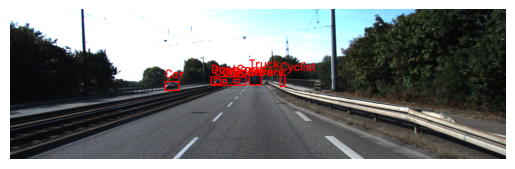

In [2]:
## Visualizing bounding boxes and class labels on an image from the KITTI dataset. 
"""Purpose
Load an Image: The script loads an image from the KITTI dataset 
(specifically from the image_2 directory, which contains the RGB images).

Load Corresponding Labels: It loads the corresponding label file from the label_2 directory, which contains 
annotations (bounding boxes and class labels) for the image.

Draw Bounding Boxes and Labels: It parses the label file, extracts the bounding box coordinates and class names, 
and draws them on the image.

Display the Image: Finally, it displays the image with the overlaid bounding boxes and labels using matplotlib."""

import os
import cv2
import matplotlib.pyplot as plt

image_dir = 'resources/training/image_2'
label_dir = 'resources/training/label_2'

image_path = os.path.join(image_dir, "000001.png")
label_path = os.path.join(label_dir, "000001.txt")

image = cv2.imread(image_path)
if image is None:
    raise FileNotFoundError(f"Error: Could not load image at {image_path}.")

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
height, width, _ = image.shape  

if not os.path.exists(label_path):
    raise FileNotFoundError(f"Error: Could not find label file at {label_path}.")

with open(label_path, "r") as f:
    labels = f.readlines()

for label in labels:
    parts = label.split()
    if len(parts) < 8:
        print(f"Skipping malformed label: {label}")
        continue  # skip wrong formatted rows

    class_name = parts[0]
    x1, y1, x2, y2 = map(float, [parts[4], parts[5], parts[6], parts[7]])
    if x1 < 1 and y1 < 1 and x2 < 1 and y2 < 1:
        x1, y1, x2, y2 = int(x1 * width), int(y1 * height), int(x2 * width), int(y2 * height)
    else:
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

    cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
    cv2.putText(image, class_name, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

plt.imshow(image)
plt.axis("off")
plt.show()




In [4]:
"""Analyzing the KITTI dataset by calculating statistics about the class distribution and bounding box sizes 
of objects in the dataset."""

"""Purpose
Class Distribution Analysis:

Counting the occurrences of each object class (e.g., Car, Pedestrian, Cyclist) in the dataset.

This helps understand the dataset's composition and identify potential class imbalances.

Bounding Box Size Analysis:

Calculating the average, minimum, and maximum sizes of bounding boxes in the dataset.

This provides insights into the scale and variability of objects in the images.

Dataset Inspection:

Process a subset of the dataset (up to 100 images) to ensure the script runs efficiently while still 
providing meaningful statistics."""

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from tqdm import tqdm  # Progress bar

image_dir = 'resources/training/image_2'  # Path to images
label_dir = 'resources/training/label_2'  # Path to labels

class_counts = Counter()
bbox_sizes = []

image_files = sorted(os.listdir(image_dir))
label_files = sorted(os.listdir(label_dir))

num_images = min(100, len(image_files))  # Process up to 100 images
image_files = image_files[:num_images]
label_files = label_files[:num_images]

if len(image_files) != len(label_files):
    print(f"Warning: Mismatch - {len(image_files)} images and {len(label_files)} labels")

for img_file, lbl_file in tqdm(zip(image_files, label_files), total=len(image_files), desc="Processing Images"):
    image_path = os.path.join(image_dir, img_file)
    label_path = os.path.join(label_dir, lbl_file)

    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image {image_path}")
        continue
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    with open(label_path, "r") as f:
        labels = f.readlines()

    for label in labels:
        parts = label.split()
        class_name = parts[0]  # Object class (Car, Pedestrian, Cyclist, etc.)
        x1, y1, x2, y2 = map(float, [parts[4], parts[5], parts[6], parts[7]])  # Bounding box coordinates

        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

        class_counts[class_name] += 1

        bbox_sizes.append((x2 - x1, y2 - y1))

bbox_sizes = np.array(bbox_sizes)

print("\nDataset Statistics\n")
print("Class Distribution:", class_counts)
print("Average Bounding Box Size:", np.mean(bbox_sizes, axis=0))
print("Bounding Box Min-Max Sizes:", np.min(bbox_sizes, axis=0), "-", np.max(bbox_sizes, axis=0))


Processing Images: 100%|█████████████████████████████████████████████████████████████| 100/100 [00:02<00:00, 39.48it/s]


Dataset Statistics

Class Distribution: Counter({'Car': 302, 'DontCare': 236, 'Pedestrian': 46, 'Van': 33, 'Cyclist': 17, 'Truck': 14, 'Tram': 12, 'Misc': 6, 'Person_sitting': 5})
Average Bounding Box Size: [81.80029806 57.90461997]
Bounding Box Min-Max Sizes: [6 4] - [497 375]


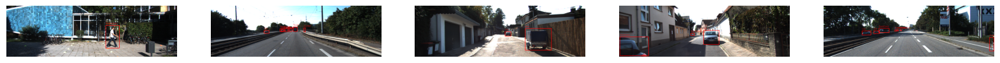

In [5]:
""" Visualizng a subset of images from the KITTI dataset along with their corresponding bounding boxes and class labels."""

"""Purpose
Visualizing Images and Annotations:

Loaded a subset of images (up to 5 by default) from the KITTI dataset.

Draw bounding boxes and class labels on the images using annotations from the corresponding label files.

Displaying the annotated images in a grid using matplotlib.

Dataset Inspection:

Quickly inspected the dataset to ensure that the images and annotations are correctly aligned and formatted."""

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Dataset paths
image_dir = 'resources/training/image_2' 
label_dir = 'resources/training/label_2'

# Get sorted lists of image and label files
image_files = sorted(os.listdir(image_dir))
label_files = sorted(os.listdir(label_dir))

# Select the first 5 images for visualization
num_visualizations = 5
image_files = image_files[:num_visualizations]
label_files = label_files[:num_visualizations]

# Create a figure for multiple images
fig, axes = plt.subplots(1, num_visualizations, figsize=(20, 5))

# Loop through selected images
for i, (img_file, lbl_file) in enumerate(zip(image_files, label_files)):
    image_path = os.path.join(image_dir, img_file)
    label_path = os.path.join(label_dir, lbl_file)

    # Load image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image {image_path}")
        continue
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Read label file
    with open(label_path, "r") as f:
        labels = f.readlines()

    # Draw bounding boxes
    for label in labels:
        parts = label.split()
        class_name = parts[0]
        x1, y1, x2, y2 = map(float, [parts[4], parts[5], parts[6], parts[7]])

        # Convert to integer
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

        # Draw bounding box
        cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)

        # Put class label
        cv2.putText(image, class_name, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    # Show image in grid
    axes[i].imshow(image)
    axes[i].axis("off")
 

In [11]:
"""Before augmentation installed the albumentation library because is a fast and flexible library for image augmentation."""

pip install albumentations


Defaulting to user installation because normal site-packages is not writeable
  Using cached albumentations-2.0.5-py3-none-any.whl (290 kB)
  Using cached albucore-0.0.23-py3-none-any.whl (14 kB)
Note: you may need to restart the kernel to use updated packages.


In [23]:
##DATA AUGMENTATION and DATA PREPROCESSING
"""Purpose
Image and Label Augmentation:

Applied a series of transformations (e.g., resizing, flipping, brightness/contrast adjustments) to images and their corresponding bounding boxes.

Ensured that the transformations were applied consistently to both images and labels.

Data Preprocessing:

Resized images to a fixed size (e.g., 640x480).

Saved the augmented images and labels to new directories for further use in training machine learning models.

Handling YOLO Format:

We assumed that the bounding boxes were in YOLO format (normalized [class_id, x_center, y_center, width, height]).

Efficient Processing:

In case of taking error during the process, after starting it one more time we wanted to be sure to skip processed images.

We handled errors gracefully to ensure the script continued processing even if an issue occurred with a specific image or label.

"""


import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import numpy as np
import torch  # Added missing import
from pathlib import Path

# Define augmentation pipeline
# Option 1: Without tensor conversion (simpler, recommended for just saving images)
transform = A.Compose([
    A.Resize(640, 480),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2, brightness_limit=0.08, contrast_limit=0.08),
    A.ColorJitter(p=0.1, brightness=0.03, contrast=0.03, saturation=0.03, hue=0.03),
    # A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),  # Commented out normalization
    # ToTensorV2() removed for simplicity
], bbox_params=A.BboxParams(format="yolo", label_fields=["class_labels"]))

# Option 2: With tensor conversion (if you need tensors for further processing)
# transform = A.Compose([
#     A.Resize(640, 480),
#     A.HorizontalFlip(p=0.5),
#     A.RandomBrightnessContrast(p=0.2, brightness_limit=0.08, contrast_limit=0.08),
#     A.ColorJitter(p=0.1, brightness=0.03, contrast=0.03, saturation=0.03, hue=0.03),
#     # A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
#     ToTensorV2(),
# ], bbox_params=A.BboxParams(format="yolo", label_fields=["class_labels"]))

# Paths
image_dir = Path('resources/training/image_2')
label_dir = Path('resources/training/label_2')
output_image_dir = Path('resources/processed_images')
output_label_dir = Path('resources/processed_labels')

# Create output directories if they don't exist
output_image_dir.mkdir(parents=True, exist_ok=True)
output_label_dir.mkdir(parents=True, exist_ok=True)

# Process images
image_files = sorted(image_dir.glob("*.png"))
for img_path in image_files:
    try:
        img_name = img_path.name
        label_path = label_dir / img_name.replace(".png", ".txt")
        save_img_path = output_image_dir / img_name
        save_label_path = output_label_dir / label_path.name

        # Skip if already processed
        if save_img_path.exists() and save_label_path.exists():
            print(f"Skipping {img_name}, already processed.")
            continue

        # Read image
        image = cv2.imread(str(img_path))
        if image is None:
            print(f"❌ Error loading image: {img_path}")
            continue
        
        # Convert to RGB for augmentation
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Read label
        bboxes, class_labels = [], []
        if label_path.exists():
            with open(label_path, "r") as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        class_id, x, y, w, h = map(float, parts)
                        bboxes.append([x, y, w, h])
                        class_labels.append(int(class_id))

        # Apply augmentation
        augmented = transform(image=image, bboxes=bboxes, class_labels=class_labels)
        aug_image = augmented["image"]
        aug_bboxes = augmented["bboxes"]
        aug_labels = augmented["class_labels"]

        # Convert for saving (handling both tensor and numpy formats)
        if isinstance(aug_image, torch.Tensor):
            # Convert tensor to numpy array
            aug_image = aug_image.permute(1, 2, 0).cpu().numpy()
            # If normalized, scale back to 0-255 range
            aug_image = (aug_image * 255).astype(np.uint8)
        
        # Convert back to BGR for OpenCV saving
        aug_image = cv2.cvtColor(aug_image, cv2.COLOR_RGB2BGR)

        # Save augmented image
        cv2.imwrite(str(save_img_path), aug_image)

        # Save augmented labels
        with open(save_label_path, "w") as f:
            for bbox, label in zip(aug_bboxes, aug_labels):
                f.write(f"{label} " + " ".join(map(str, bbox)) + "\n")

        print(f"✅ Processed {img_name}")
    except Exception as e:
        print(f"⚠️ Error processing {img_path.name}: {e}")
        continue  # Skip to the next image

print("✅ Data preprocessing (image + labels) is done.")

✅ Processed 000000.png
✅ Processed 000001.png
✅ Processed 000002.png
✅ Processed 000003.png
✅ Processed 000004.png
✅ Processed 000005.png
✅ Processed 000006.png
✅ Processed 000007.png
✅ Processed 000008.png
✅ Processed 000009.png
✅ Processed 000010.png
✅ Processed 000011.png
✅ Processed 000012.png
✅ Processed 000013.png
✅ Processed 000014.png
✅ Processed 000015.png
✅ Processed 000016.png
✅ Processed 000017.png
✅ Processed 000018.png
✅ Processed 000019.png
✅ Processed 000020.png
✅ Processed 000021.png
✅ Processed 000022.png
✅ Processed 000023.png
✅ Processed 000024.png
✅ Processed 000025.png
✅ Processed 000026.png
✅ Processed 000027.png
✅ Processed 000028.png
✅ Processed 000029.png
✅ Processed 000030.png
✅ Processed 000031.png
✅ Processed 000032.png
✅ Processed 000033.png
✅ Processed 000034.png
✅ Processed 000035.png
✅ Processed 000036.png
✅ Processed 000037.png
✅ Processed 000038.png
✅ Processed 000039.png
✅ Processed 000040.png
✅ Processed 000041.png
✅ Processed 000042.png
✅ Processed

In [ ]:
##Verification of Augmented Data:
"""The augmented images and their corresponding labels were verified to ensure they matched correctly.

A visualization of the augmented images with overlaid bounding boxes and class
labels was created to confirm the correctness of the augmentation process."""


import matplotlib.pyplot as plt
import cv2
import numpy as np
from pathlib import Path

def verify_augmentation(output_image_dir, output_label_dir, num_samples=5):
    """    
    Parameters:
    output_image_dir (Path): Directory containing augmented images
    output_label_dir (Path): Directory containing augmented labels
    num_samples (int): Number of samples to visualize
    """
    # Get all processed images and labels
    processed_images = list(output_image_dir.glob("*.png"))
    
    # Randomly select samples
    np.random.seed(42)  # For reproducibility
    if len(processed_images) > num_samples:
        image_samples = np.random.choice(processed_images, num_samples, replace=False)
    else:
        image_samples = processed_images
    
    # Create figure for visualization
    fig, axes = plt.subplots(1, len(image_samples), figsize=(20, 5))
    if len(image_samples) == 1:
        axes = [axes]  # Make sure axes is always a list
    
    # Process each sample
    for i, img_path in enumerate(image_samples):
        # Get corresponding label path
        label_path = output_label_dir / img_path.name.replace(".png", ".txt")
        
        # Read image
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Read label
        bboxes = []
        class_ids = []
        if label_path.exists():
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        class_id, x_center, y_center, width, height = map(float, parts)
                        bboxes.append([x_center, y_center, width, height])
                        class_ids.append(int(class_id))
        
        # Draw bounding boxes
        h, w, _ = img.shape
        for bbox, class_id in zip(bboxes, class_ids):
            x_center, y_center, width, height = bbox
            x1 = int((x_center - width/2) * w)
            y1 = int((y_center - height/2) * h)
            x2 = int((x_center + width/2) * w)
            y2 = int((y_center + height/2) * h)
            
            # Draw rectangle
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
            # Draw class label
            cv2.putText(img, f"Class: {class_id}", (x1, y1-10), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        
        # Display image
        axes[i].imshow(img)
        axes[i].set_title(f"Augmented {img_path.name}")
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"✅ Verified {len(image_samples)} augmented images and their labels")

output_image_dir = Path('resources/processed_images')
output_label_dir = Path('resources/processed_labels')

verify_augmentation(output_image_dir, output_label_dir, num_samples=5)

In [71]:
# KITTI dataset configuration for YOLOv5

kitti_config = {
    'nc': 3,  # number of classes
    'names': ['class_0', 'class_1', 'class_2'],  # class names

    # Dataset paths (use absolute paths)
    'path': 'C:/Users/huma/resources',  # dataset root dir
    'train': 'C:/Users/huma/resources/train.txt',  # train images
    'val': 'C:/Users/huma/resources/val.txt'  # val images
}

# Display the configuration
kitti_config


{'nc': 3,
 'names': ['class_0', 'class_1', 'class_2'],
 'path': 'C:/Users/huma/resources',
 'train': 'C:/Users/huma/resources/train.txt',
 'val': 'C:/Users/huma/resources/val.txt'}

In [73]:
###Prepared the dataset for training by:

"""Creating train.txt and val.txt files that list the paths to training and validation images.

Checking if label files exist for all images and ensuring they are in the correct YOLO format.
"""
import os
import random
import glob

# Define paths
resources_dir = r"C:\Users\huma\resources"
images_dir = os.path.join(resources_dir, "images")
labels_dir = os.path.join(resources_dir, "labels")

# Create directories if they don't exist
os.makedirs(images_dir, exist_ok=True)
os.makedirs(labels_dir, exist_ok=True)

def create_dataset_files():
    """Create train.txt and val.txt files for YOLOv5"""
    # Check if we have images
    image_files = glob.glob(os.path.join(images_dir, "*.jpg")) + \
                 glob.glob(os.path.join(images_dir, "*.png"))
    
    if not image_files:
        print("No images found! Please add images to the resources/images folder.")
        return False
    
    # Shuffle and split into train/val (80/20 split)
    random.shuffle(image_files)
    split_idx = int(len(image_files) * 0.8)
    train_images = image_files[:split_idx]
    val_images = image_files[split_idx:]
    
    # Write train.txt
    with open(os.path.join(resources_dir, "train.txt"), "w") as f:
        for img_path in train_images:
            f.write(img_path + "\n")
    
    # Write val.txt
    with open(os.path.join(resources_dir, "val.txt"), "w") as f:
        for img_path in val_images:
            f.write(img_path + "\n")
    
    print(f"Created train.txt with {len(train_images)} images")
    print(f"Created val.txt with {len(val_images)} images")
    return True

def check_labels():
    """Check if label files exist for all images"""
    image_files = glob.glob(os.path.join(images_dir, "*.jpg")) + \
                 glob.glob(os.path.join(images_dir, "*.png"))
                 
    missing_labels = []
    
    for img_path in image_files:
        img_name = os.path.basename(img_path)
        img_stem = os.path.splitext(img_name)[0]
        label_path = os.path.join(labels_dir, f"{img_stem}.txt")
        
        if not os.path.exists(label_path):
            missing_labels.append(img_name)
    
    if missing_labels:
        print(f"WARNING: Missing label files for {len(missing_labels)} images:")
        for img in missing_labels[:10]:
            print(f"  - {img}")
        if len(missing_labels) > 10:
            print(f"  ... and {len(missing_labels) - 10} more")
            
        print("\nLabel files should be in YOLO format (one .txt file per image with the same name)")
        print("Each line in the label file should be: class_id x_center y_center width height")
        print("All values are normalized between 0 and 1")
    else:
        print("All images have corresponding label files. Good!")

# Run the functions
print("Checking KITTI dataset structure...")
if create_dataset_files():
    check_labels()
    print("\nDataset is ready for training!")
    print("You can now run YOLOv5 training with the updated YAML configuration.")

Checking KITTI dataset structure...
Created train.txt with 5984 images
Created val.txt with 1497 images
All images have corresponding label files. Good!

Dataset is ready for training!
You can now run YOLOv5 training with the updated YAML configuration.


In [ ]:
"""Purpose
YAML Configuration Fix:

The YAML configuration file for the KITTI dataset was loaded and updated to use absolute paths for the dataset root directory, training, and validation files.

This ensured that the YOLOv5 training script could correctly locate the dataset files.

YOLOv5 Training:

The YOLOv5 model was trained using the updated YAML configuration file.

Parameters such as image size, batch size, and number of epochs were adjusted to reduce RAM usage and improve training efficiency.

Error Handling and Real-Time Output:

The training process was executed using subprocess.Popen, allowing real-time output of the training logs.

Errors during training were caught and displayed, ensuring that issues could be identified and addressed promptly."""


import os
import yaml
import subprocess
import sys

# Paths
yolo_path = r'C:\Users\huma\yolov5\yolov5\yolov5'
config_path = r"C:\Users\huma\resources\kitti.yaml"

# Fix the YAML configuration
with open(config_path, 'r') as f:
    yaml_data = yaml.safe_load(f)
    print("Original YAML configuration:")
    print(yaml_data)
    
    # Fix the paths to use absolute paths
    yaml_data['path'] = r'C:\Users\huma\resources'  # Use absolute path
    yaml_data['train'] = r'C:\Users\huma\resources\train.txt'  # Use absolute path
    yaml_data['val'] = r'C:\Users\huma\resources\val.txt'  # Use absolute path
    
    print("\nUpdated YAML configuration:")
    print(yaml_data)

# Write the updated YAML back to the file
with open(config_path, 'w') as f:
    yaml.dump(yaml_data, f)
    print("\nYAML file updated successfully.")

# Run the training again
os.chdir(yolo_path)
print(f"\nWorking directory: {os.getcwd()}")
print("\nStarting YOLOv5 training...")

# RAM kullanımını azaltmak için parametreleri değiştirdik
cmd = [
    "python", "train.py",
    "--img", "416",      # Görüntü boyutu küçültüldü
    "--batch", "4",      # Batch boyutu azaltıldı
    "--epochs", "30",
    "--data", config_path,
    "--weights", "yolov5s.pt",
    "--workers", "2"     # Paralel işlem sayısı azaltıldı
    # "--cache" parametresi kaldırıldı
]

print(f"Running: {' '.join(cmd)}")

try:
    # Gerçek zamanlı olarak çıktıları görmek için subprocess kullanıyoruz
    process = subprocess.Popen(
        cmd,
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
        universal_newlines=True,
        bufsize=1
    )
    
    # Çıktıyı gerçek zamanlı olarak okuyoruz
    for line in iter(process.stdout.readline, ''):
        print(line, end='')
        sys.stdout.flush()
    
    process.stdout.close()
    return_code = process.wait()
    print(f"\nTraining completed with return code: {return_code}")
    
except Exception as e:
    print(f"\nError during training: {e}")

Original YAML configuration:
{'names': ['class_0', 'class_1', 'class_2'], 'nc': 3, 'path': 'C:\\Users\\huma\\resources', 'train': 'C:\\Users\\huma\\resources\\train.txt', 'val': 'C:\\Users\\huma\\resources\\val.txt'}

Updated YAML configuration:
{'names': ['class_0', 'class_1', 'class_2'], 'nc': 3, 'path': 'C:\\Users\\huma\\resources', 'train': 'C:\\Users\\huma\\resources\\train.txt', 'val': 'C:\\Users\\huma\\resources\\val.txt'}

YAML file updated successfully.

Working directory: C:\Users\huma\yolov5\yolov5\yolov5

Starting YOLOv5 training...
Running: python train.py --img 416 --batch 4 --epochs 30 --data C:\Users\huma\resources\kitti.yaml --weights yolov5s.pt --workers 2
train: weights=yolov5s.pt, cfg=, data=C:\Users\huma\resources\kitti.yaml, hyp=data\hyps\hyp.scratch-low.yaml, epochs=30, batch_size=4, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data\hyps, resume_evolve=None, bucket=, cache=None, 

In [12]:
##Perform object detection on a video using the YOLOv5 (You Only Look Once) model. 

import cv2
import torch
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import warnings
from matplotlib import rcParams

# Suppress FutureWarnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Matplotlib settings for full-screen display
rcParams['figure.figsize'] = (12, 8)
plt.ion()  # Enable interactive mode

# Path to the trained model weights
weights_path = r'C:\Users\huma\yolov5\yolov5\yolov5\runs\train\exp15\weights\best.pt'  # Full path
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # Use GPU if available
model = torch.hub.load('ultralytics/yolov5', 'custom', path=weights_path)  # Load YOLOv5 model
model.to(device)  # Move model to the appropriate device (GPU/CPU)

# Memory optimization settings
model.conf = 0.25  # Confidence threshold
model.iou = 0.45   # IoU threshold
model.agnostic = False  # Non-maximum suppression (NMS) not class-agnostic
model.multi_label = False  # Do not allow multiple labels per box
model.max_det = 1000  # Maximum number of detections

def process_video(video_path, output_path=None, show=True):
    """
    Process a video for object detection using the YOLOv5 model.
    
    Parameters:
    video_path (str): Path to the input video file.
    output_path (str): Path to save the output video file (optional).
    show (bool): Whether to display the processed frames in real-time.
    """
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Could not open {video_path}")
        return
    
    # Get video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Initialize video writer (if output path is provided)
    if output_path:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
    
    # Prepare for displaying frames using Matplotlib
    if show:
        fig = plt.figure()
        ax = fig.add_subplot(111)
        ax.axis('off')
        fig_img = None  # Placeholder for the displayed image
    
    frame_count = 0
    print(f"Processing video: {video_path}")
    print(f"Total frames: {total_frames}")
    
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        
        # Progress information (every 30 frames)
        frame_count += 1
        if frame_count % 30 == 0:
            print(f"Processed frame: {frame_count}/{total_frames} ({frame_count/total_frames*100:.1f}%)")
        
        # RAM optimization: Create a copy of the frame and clear unnecessary references
        img = frame.copy()
        
        # Perform object detection using the model
        results = model(img)
        
        # Visualize the results
        result_frame = results.render()[0]  # Get the rendered frame
        
        # Display using Matplotlib (instead of cv2.imshow)
        if show:
            # Convert BGR to RGB (for Matplotlib)
            result_rgb = cv2.cvtColor(result_frame, cv2.COLOR_BGR2RGB)
            
            if fig_img is None:
                fig_img = ax.imshow(result_rgb)  # Initialize the image display
            else:
                fig_img.set_data(result_rgb)  # Update the image data
            
            plt.draw()
            plt.pause(0.001)  # Update the display
            
            # Exit if a key is pressed (when the Matplotlib window is active)
            if plt.waitforbuttonpress(0.001):  # Exit if any key is pressed
                break
        
        # Save the frame (if output path is provided)
        if output_path:
            out.write(result_frame)
        
        # RAM optimization
        del img
        torch.cuda.empty_cache() if torch.cuda.is_available() else None  # Clear GPU cache
    
    # Release resources
    cap.release()
    if output_path:
        out.release()
    
    if show:
        plt.close()  # Close the Matplotlib window
    
    print(f"Video processing completed. Output: {output_path}")

# Perform object detection on a video
video_path = r"C:\Users\huma\resources\videos_train_00024.mp4"  # Full path to the video file
output_path = 'output_videoo.mp4'  # Path to save the output video file

# Optimize GPU memory usage by disabling gradient calculations
with torch.no_grad():  # Disable gradient calculation (saves memory)
    process_video(video_path, output_path, show=True)

Using cache found in C:\Users\huma/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2025-3-17 Python-3.10.9 torch-2.5.1+cpu CPU

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Processing video: C:\Users\huma\resources\videos_train_00024.mp4
Total frames: 198
Processed frame: 30/198 (15.2%)
Processed frame: 60/198 (30.3%)
Processed frame: 90/198 (45.5%)
Processed frame: 120/198 (60.6%)
Processed frame: 150/198 (75.8%)
Processed frame: 180/198 (90.9%)
Video processing completed. Output: output_videoo.mp4
